# Notebook 1 — What Is a Digital Image? Basic Image Processing

**Digital Humanities · Image Processing for Museums & Cultural Heritage**

In this notebook you will learn:

1. What a digital image *actually is* (a grid of numbers!)
2. How to load, inspect, crop, resize, and rotate images with **Pillow (PIL)** and **OpenCV**
3. Color spaces: RGB, grayscale, HSV
4. Histograms — the "fingerprint" of an image's tonal range
5. Enhancement: contrast stretching and equalization (useful for **faded artworks and old photographs**)
6. Filtering: blurring, sharpening, and noise removal (digital **restoration**)

Our sample images are public-domain artworks and monuments from
[Wikimedia Commons](https://commons.wikimedia.org), downloaded by
`scripts/download_data.py` into `data/raw/`.

In [8]:
from pathlib import Path

import cv2                      # OpenCV: the classic computer-vision library
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image           # Pillow: friendly image loading & editing

DATA = Path("..") / "data" / "raw"
OUT = Path("..") / "outputs"
OUT.mkdir(exist_ok=True)

sorted(p.name for p in DATA.glob("*.jpg"))

['american_gothic.jpg',
 'girl_pearl_earring.jpg',
 'great_wave.jpg',
 'louvre_crowd.jpg',
 'mona_lisa.jpg',
 'nefertiti.jpg',
 'rosetta_stone.jpg',
 'starry_night.jpg',
 'stonehenge.jpg',
 'the_scream.jpg']

## 1. An image is a grid of numbers

When a museum digitizes a painting, the scanner measures light at millions of
points. Each point becomes a **pixel** — typically three numbers (Red, Green,
Blue), each between 0 and 255.

Format: JPEG
Size (width × height): (1280, 1908)
Mode: RGB


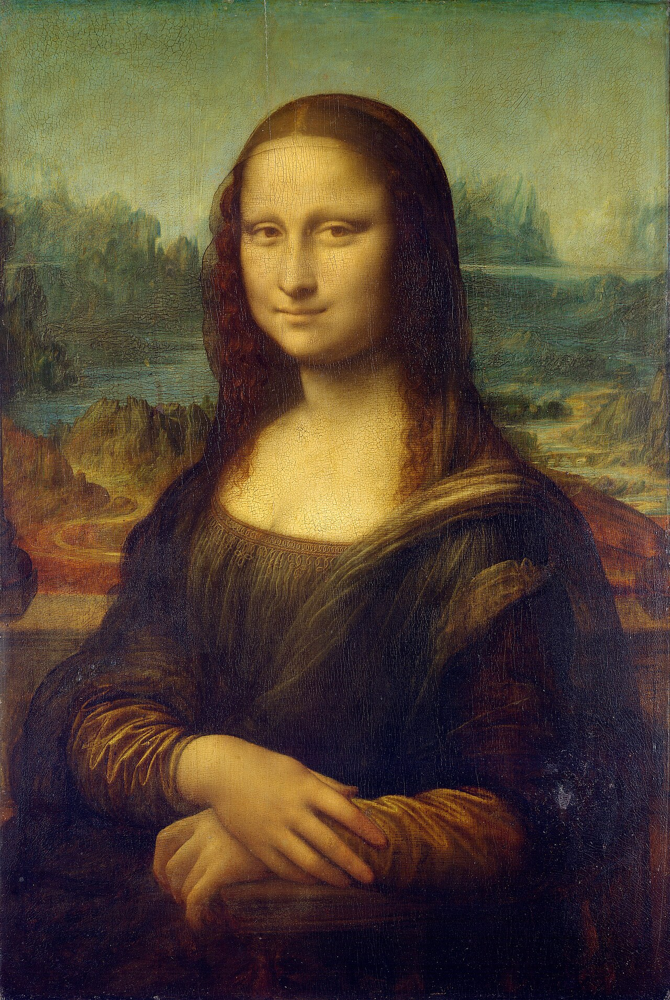

In [9]:
img = Image.open(DATA / "mona_lisa.jpg")
print("Format:", img.format)
print("Size (width × height):", img.size)
print("Mode:", img.mode)   # RGB = 3 channels
img

In [11]:
# Convert to a NumPy array to see the numbers behind the picture
arr = np.array(img)
print("Array shape (height, width, channels):", arr.shape)
print("Data type:", arr.dtype, "— values from", arr.min(), "to", arr.max())
print("\nThe top-left 3×3 corner of the painting, as raw numbers:")
print(arr[:3, :3])

Array shape (height, width, channels): (1908, 1280, 3)
Data type: uint8 — values from 0 to 255

The top-left 3×3 corner of the painting, as raw numbers:
[[[101 112  82]
  [101 112  82]
  [ 91  99  75]]

 [[124 135 105]
  [ 88  98  71]
  [ 88  98  73]]

 [[ 88 101  73]
  [165 178 150]
  [106 116  91]]]


Every operation in this course — from a simple crop to a neural network —
is mathematics applied to arrays like this one.

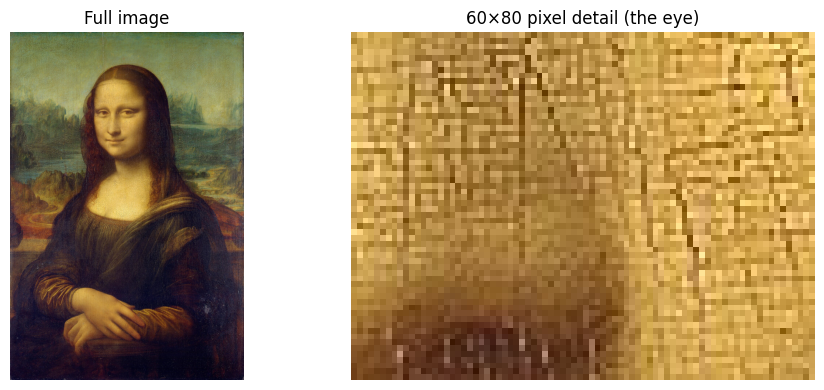

In [12]:
# Zoom in far enough and the grid becomes visible: Mona Lisa's eye, pixel by pixel
eye = arr[500:560, 560:640]
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1); plt.imshow(arr); plt.title("Full image"); plt.axis("off")
plt.subplot(1, 2, 2); plt.imshow(eye); plt.title("60×80 pixel detail (the eye)"); plt.axis("off")
plt.tight_layout(); plt.show()

## 2. Cropping, resizing, rotating

These are the bread-and-butter operations of any digitization workflow:
making thumbnails for an online catalog, straightening a scan, extracting
a detail for a publication.

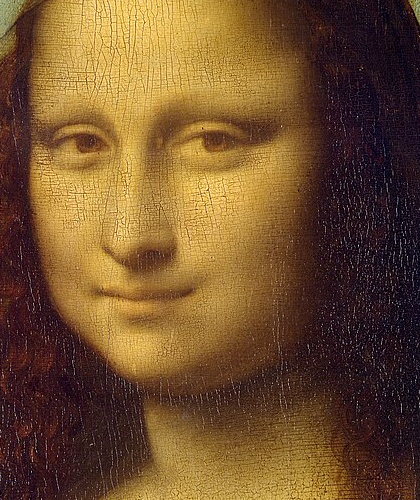

In [13]:
# Cropping with PIL: box = (left, upper, right, lower)
face = img.crop((430, 300, 850, 800))
face

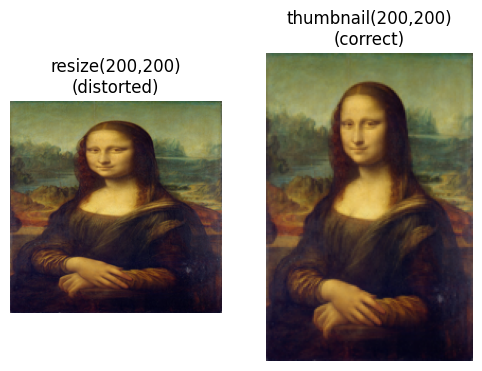

In [14]:
# Resizing — ALWAYS think about aspect ratio.
thumb_distorted = img.resize((200, 200))                  # squashed!
thumb_correct = img.copy(); thumb_correct.thumbnail((200, 200))  # keeps proportions

fig, axes = plt.subplots(1, 2, figsize=(6, 4))
axes[0].imshow(thumb_distorted); axes[0].set_title("resize(200,200)\n(distorted)")
axes[1].imshow(thumb_correct); axes[1].set_title("thumbnail(200,200)\n(correct)")
for ax in axes: ax.axis("off")
plt.show()

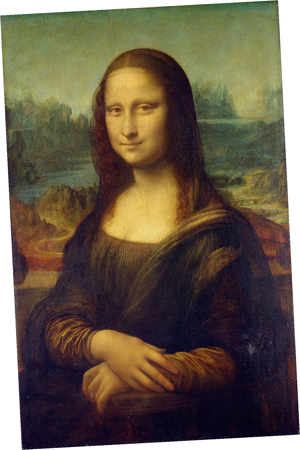

In [7]:
# Rotating (e.g. fixing a crooked scan). expand=True grows the canvas to fit.
img.rotate(3, expand=True, fillcolor="white").resize((300, 450))

## 3. OpenCV and the BGR trap

OpenCV is faster and more powerful than PIL, but it has one famous quirk:
it loads images in **BGR** order (Blue-Green-Red) instead of RGB — a
historical accident from 1990s camera hardware. Forgetting to convert is
the #1 beginner bug in computer vision.

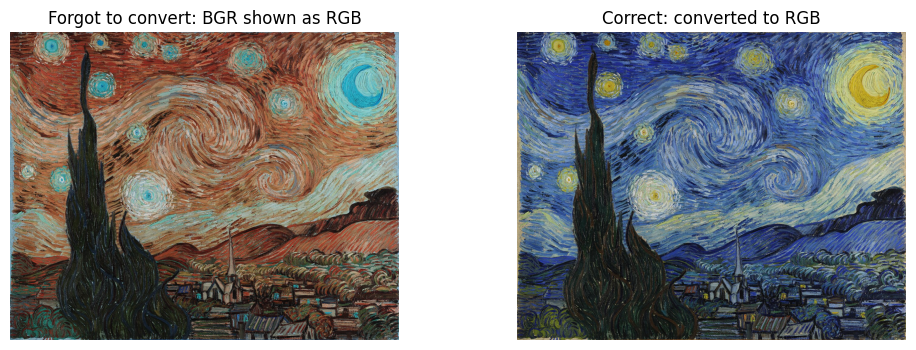

In [15]:
cv_img = cv2.imread(str(DATA / "starry_night.jpg"))   # BGR!
cv_rgb = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)      # fixed

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(cv_img); axes[0].set_title("Forgot to convert: BGR shown as RGB")
axes[1].imshow(cv_rgb); axes[1].set_title("Correct: converted to RGB")
for ax in axes: ax.axis("off")
plt.show()

## 4. Color spaces

- **Grayscale** removes color, keeping only brightness — useful for analyzing
  composition, engravings, manuscripts.
- **HSV** (Hue, Saturation, Value) separates *what color* from *how vivid* and
  *how bright* — useful for studying an artist's palette.

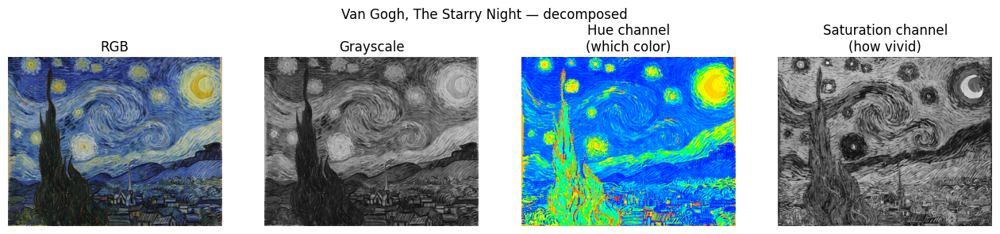

In [ ]:
gray = cv2.cvtColor(cv_rgb, cv2.COLOR_RGB2GRAY)
hsv = cv2.cvtColor(cv_rgb, cv2.COLOR_RGB2HSV)

fig, axes = plt.subplots(1, 4, figsize=(16, 3.5))
axes[0].imshow(cv_rgb); axes[0].set_title("RGB")
axes[1].imshow(gray, cmap="gray"); axes[1].set_title("Grayscale") # grayscale is a single number, so grayscale colormap is appropriate
axes[2].imshow(hsv[:, :, 0], cmap="hsv"); axes[2].set_title("Hue channel\n(which color)") # hue is an angle, so hsv colormap is appropriate
axes[3].imshow(hsv[:, :, 1], cmap="gray"); axes[3].set_title("Saturation channel\n(how vivid)") # saturation is a single number, so grayscale is appropriate
for ax in axes: ax.axis("off")
plt.suptitle("Van Gogh, The Starry Night — decomposed")
plt.show()

## 5. Histograms: the tonal fingerprint

A histogram counts how many pixels have each brightness value. Conservators
and photographers read histograms to spot **fading** (values bunched in the
middle), **overexposure** (peak at 255) or **underexposure** (peak at 0).

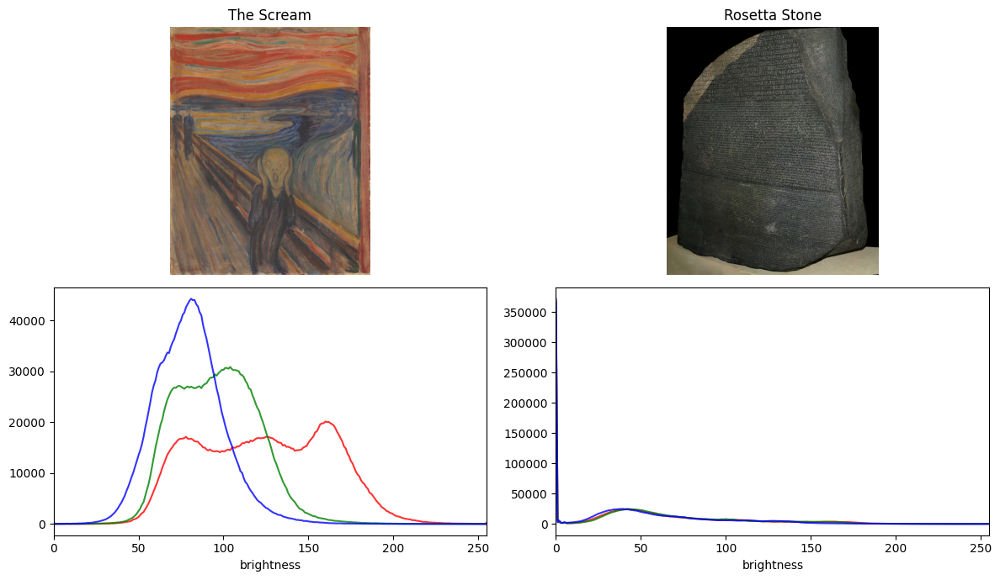

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(12, 7))
for col, (name, file) in enumerate([("The Scream", "the_scream.jpg"),
                                    ("Rosetta Stone", "rosetta_stone.jpg")]):
    im = cv2.cvtColor(cv2.imread(str(DATA / file)), cv2.COLOR_BGR2RGB)
    axes[0, col].imshow(im); axes[0, col].set_title(name); axes[0, col].axis("off")
    for channel, color in enumerate(["red", "green", "blue"]):
        hist = cv2.calcHist([im], [channel], None, [256], [0, 256])
        axes[1, col].plot(hist, color=color, alpha=0.8)
    axes[1, col].set_xlim(0, 255); axes[1, col].set_xlabel("brightness")
plt.tight_layout(); plt.show()

## 6. Enhancement: reviving a faded photograph

Let's simulate a common cultural-heritage problem: a **faded archival
photograph** with poor contrast, and then restore it with
**histogram equalization** and **CLAHE** (Contrast-Limited Adaptive
Histogram Equalization — the method actually used in archives and
medical imaging).

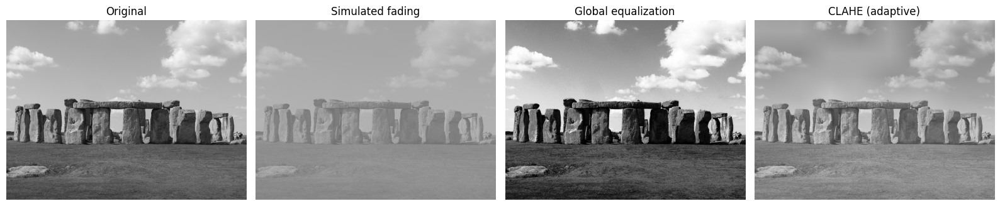

In [18]:
original = cv2.cvtColor(cv2.imread(str(DATA / "stonehenge.jpg")), cv2.COLOR_BGR2GRAY)

# Simulate fading: compress the tonal range into a narrow, washed-out band
faded = (original.astype(np.float32) * 0.35 + 110).clip(0, 255).astype(np.uint8)

equalized = cv2.equalizeHist(faded)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(faded)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, (im, title) in zip(axes, [(original, "Original"),
                                  (faded, "Simulated fading"),
                                  (equalized, "Global equalization"),
                                  (clahe, "CLAHE (adaptive)")]):
    ax.imshow(im, cmap="gray", vmin=0, vmax=255); ax.set_title(title); ax.axis("off")
plt.tight_layout(); plt.show()

## 7. Filtering: noise removal and sharpening

A **filter** (or *kernel*) slides a small window across the image and
recomputes each pixel from its neighbors. This single idea — called
**convolution** — is also the foundation of the *convolutional neural
networks* we'll meet in Notebook 3.

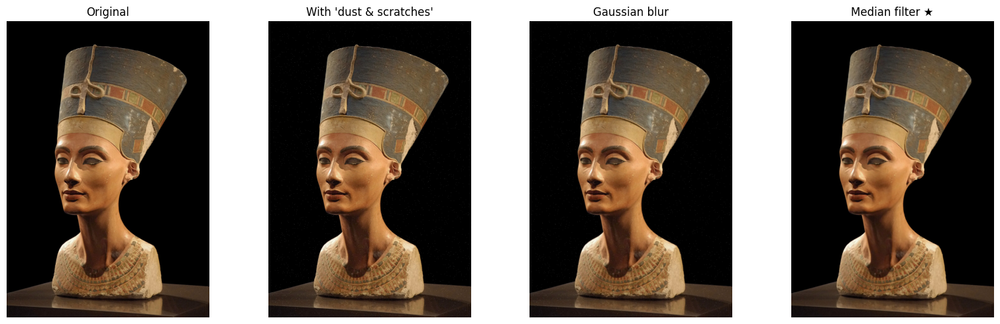

In [19]:
nefertiti = cv2.cvtColor(cv2.imread(str(DATA / "nefertiti.jpg")), cv2.COLOR_BGR2RGB)

# Simulate "dust and scratches" noise typical of old scans
rng = np.random.default_rng(42)
noisy = nefertiti.copy()
coords = rng.integers(0, noisy.shape[0], 4000), rng.integers(0, noisy.shape[1], 4000)
noisy[coords] = 255   # white specks
coords = rng.integers(0, noisy.shape[0], 4000), rng.integers(0, noisy.shape[1], 4000)
noisy[coords] = 0     # black specks

gaussian = cv2.GaussianBlur(noisy, (5, 5), 0)   # blurs noise AND detail
median = cv2.medianBlur(noisy, 5)               # removes specks, keeps edges

fig, axes = plt.subplots(1, 4, figsize=(16, 5))
for ax, (im, title) in zip(axes, [(nefertiti, "Original"),
                                  (noisy, "With 'dust & scratches'"),
                                  (gaussian, "Gaussian blur"),
                                  (median, "Median filter ★")]):
    ax.imshow(im); ax.set_title(title); ax.axis("off")
plt.tight_layout(); plt.show()

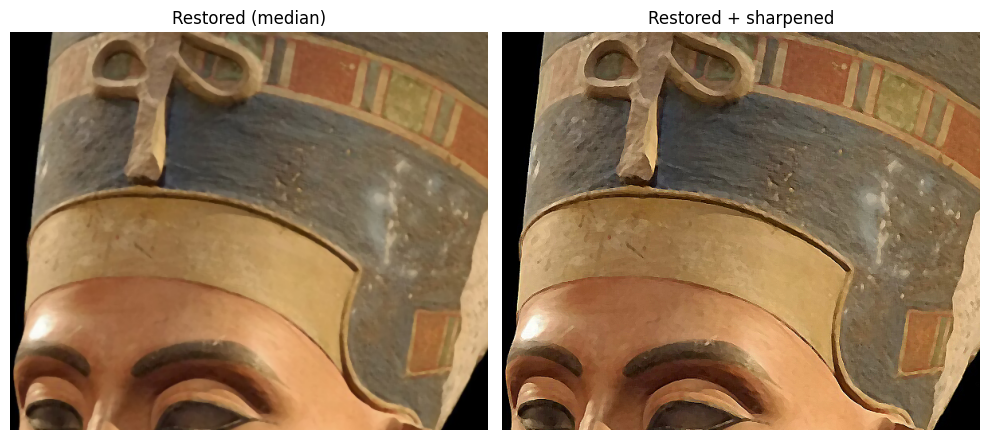

In [20]:
# Sharpening: a kernel that boosts each pixel relative to its neighbors
sharpen_kernel = np.array([[ 0, -1,  0],
                           [-1,  5, -1],
                           [ 0, -1,  0]])
sharpened = cv2.filter2D(median, -1, sharpen_kernel)

fig, axes = plt.subplots(1, 2, figsize=(10, 6))
axes[0].imshow(median[400:900, 300:900]); axes[0].set_title("Restored (median)")
axes[1].imshow(sharpened[400:900, 300:900]); axes[1].set_title("Restored + sharpened")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

In [21]:
# Save your restoration to the outputs folder
Image.fromarray(sharpened).save(OUT / "nefertiti_restored.jpg", quality=95)
print("Saved to", OUT / "nefertiti_restored.jpg")

Saved to ../outputs/nefertiti_restored.jpg


## ✏️ Exercises

1. Load `great_wave.jpg`, crop just the wave, and make a 300-px-wide
   thumbnail that keeps its proportions.
2. Plot the histogram of `girl_pearl_earring.jpg`. Is it a dark or a bright
   painting? How can you tell *from the histogram alone*?
3. The fading simulation used `* 0.35 + 110`. Try `* 0.2 + 50` (severe,
   dark fading). Does CLAHE still recover the image well?
4. Take a photo of any object near you, add salt-and-pepper noise, and
   restore it with the median filter.

**Next:** Notebook 2 — classic computer-vision techniques: edges,
thresholding, and feature matching between images.